# 2.3 Complex Machine Learning Models and Keras Part 2 - ALL Stations decade 2010

## 01 Load Libraries & Dataset
## 02 Clean & Wrangle
## 03 Shaping Data
## 04 Spliting Data
## 05 Training a Random Forest Classifier
## 06 Feature Importance Analysis
## 07 Insights

### 01 Load Libraries & Dataset

In [232]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn.model_selection import train_test_split
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.metrics import accuracy_score


In [170]:
# Create a path for the import of dataset

path = r'C:\Users\wallm\02 2025 Machine Learning Project\02 Data'

In [171]:
# Import weather dataset

climate = pd.read_csv(os.path.join(path, '02 Prepared Data', 'Dataset-weather-cleaned-reshaped.csv'))

In [172]:
climate.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure
0,19600101,-1.6,0.661,0.826,-0.002,-1.101,-0.265,-0.903,-0.529,-0.846,...,-1.300,-0.806,-0.088,0.372,-0.668,-0.520,-0.752,0.714,1.544,0.095
1,19600102,-1.6,0.245,0.736,-0.002,-1.058,1.659,-0.810,-0.583,-0.462,...,-1.262,-1.042,0.503,-0.829,-0.548,-0.629,-0.407,1.176,-0.712,0.067
2,19600103,-1.6,1.076,1.278,-0.002,-1.251,0.156,-1.065,-0.257,-0.187,...,-0.433,-1.136,-0.396,-1.010,-0.067,0.054,-0.177,0.252,-0.274,0.132
3,19600104,-1.6,-1.002,1.458,-0.002,-0.822,-0.446,-0.114,-0.556,-0.386,...,0.388,-1.183,0.669,-1.040,-0.999,-0.164,-0.839,1.176,1.544,0.419
4,19600105,-1.6,0.245,1.729,-0.002,-0.747,-0.165,0.187,-1.004,-1.076,...,1.730,-0.795,-0.491,0.673,-1.509,-1.340,-1.471,0.252,1.419,0.388


In [173]:
climate.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22950 entries, 0 to 22949
Columns: 137 entries, DATE to MUNCHENB_pressure
dtypes: float64(136), int64(1)
memory usage: 24.0 MB


In [174]:
climate.shape

(22950, 137)

In [175]:
# Import the 'Pleasant weather' dataset

pleasantweather = pd.read_csv(os.path.join(path, '01 Original Data', 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))

In [176]:
pleasantweather.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [177]:
pleasantweather.shape

(22950, 16)

### 02 Clean & Wrangle

In [179]:
climate.isnull().sum()

DATE                           0
MONTH                          0
BASEL_cloud_cover              0
BASEL_humidity                 0
BASEL_pressure                 0
BASEL_global_radiation         0
BASEL_precipitation            0
BASEL_sunshine                 0
BASEL_temp_mean                0
BASEL_temp_min                 0
BASEL_temp_max                 0
BELGRADE_cloud_cover           0
BELGRADE_humidity              0
BELGRADE_pressure              0
BELGRADE_global_radiation      0
BELGRADE_precipitation         0
BELGRADE_sunshine              0
BELGRADE_temp_mean             0
BELGRADE_temp_min              0
BELGRADE_temp_max              0
BUDAPEST_cloud_cover           0
BUDAPEST_humidity              0
BUDAPEST_pressure              0
BUDAPEST_global_radiation      0
BUDAPEST_precipitation         0
BUDAPEST_sunshine              0
BUDAPEST_temp_mean             0
BUDAPEST_temp_min              0
BUDAPEST_temp_max              0
DEBILT_cloud_cover             0
DEBILT_hum

In [180]:
pleasantweather.isnull().sum()

DATE                           0
BASEL_pleasant_weather         0
BELGRADE_pleasant_weather      0
BUDAPEST_pleasant_weather      0
DEBILT_pleasant_weather        0
DUSSELDORF_pleasant_weather    0
HEATHROW_pleasant_weather      0
KASSEL_pleasant_weather        0
LJUBLJANA_pleasant_weather     0
MAASTRICHT_pleasant_weather    0
MADRID_pleasant_weather        0
MUNCHENB_pleasant_weather      0
OSLO_pleasant_weather          0
SONNBLICK_pleasant_weather     0
STOCKHOLM_pleasant_weather     0
VALENTIA_pleasant_weather      0
dtype: int64

In [181]:
# Step 1: Filter the main data (climate) for only the years 2010 to 2019
# This reduces the dataset to one decade to speed up training and improve consistency
climate_decade = climate[
    (climate['DATE'].astype(str).str[:4] >= '2010') &
    (climate['DATE'].astype(str).str[:4] <= '2019')
]

# Preview the filtered data
climate_decade

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,STOCKHOLM_humidity,MUNCHENB_pressure
18263,20100101,-1.600,1.076,1.549,-3.288,-1.251,0.677,-1.065,-1.018,-0.999,...,-0.200,-0.830,-0.491,0.763,-2.711,-2.597,-2.449,-0.673,0.165,-0.486
18264,20100102,-1.600,-1.002,-0.168,0.197,-0.822,-0.446,0.141,-1.615,-1.612,...,0.499,-0.806,-0.491,0.763,-2.981,-3.389,-2.104,1.176,0.040,-0.030
18265,20100103,-1.600,-1.002,-0.077,0.701,-0.790,-0.446,0.396,-1.846,-1.888,...,0.499,-0.912,-0.006,-0.559,-3.072,-3.280,-2.420,-0.673,0.667,0.328
18266,20100104,-1.600,-0.171,0.645,-0.170,-0.929,-0.446,-0.207,-2.077,-2.241,...,0.714,-0.771,0.113,0.913,-2.110,-1.804,-2.794,1.176,0.980,0.123
18267,20100105,-1.600,0.661,0.194,-1.637,-0.876,-0.365,-0.045,-1.955,-2.057,...,-0.237,-0.806,-0.384,0.372,-2.531,-2.351,-2.334,0.714,0.290,-0.133
18268,20100106,-1.600,1.076,1.007,-2.050,-1.241,-0.425,-1.065,-1.778,-1.581,...,-0.023,-0.759,-0.491,0.793,-2.381,-1.722,-2.708,-0.211,0.479,-0.356
18269,20100107,-1.600,0.661,0.736,-1.271,-1.004,-0.305,-0.926,-1.656,-1.888,...,0.406,-0.830,-0.455,-0.078,-2.921,-3.225,-2.190,-1.135,0.228,-0.105
18270,20100108,-1.600,1.076,1.458,-1.347,-1.241,0.476,-1.065,-1.792,-1.735,...,1.087,-0.748,-0.491,0.943,-2.681,-2.679,-2.305,0.252,0.416,-0.163
18271,20100109,-1.600,1.076,1.007,-1.515,-1.241,0.476,-1.065,-2.063,-1.796,...,1.497,-0.748,106.028,0.402,-3.402,-3.444,-2.909,1.176,0.479,-0.382
18272,20100110,-1.600,1.076,0.736,-0.491,-1.176,-0.446,-1.065,-1.914,-1.673,...,0.844,-1.148,-0.455,-1.040,-3.522,-3.389,-3.427,1.176,0.541,-0.179


In [182]:
# Step 2: Similarly, filter the answers dataset (pleasant weather labels) for the same time period
# This ensures your features (X) and labels (y) match in time
pleasantweather_decade = pleasantweather[
    (pleasantweather['DATE'].astype(str).str[:4] >= '2010') &
    (pleasantweather['DATE'].astype(str).str[:4] <= '2019')
]

# Preview the filtered labels
pleasantweather_decade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18263,20100101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18264,20100102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18265,20100103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18266,20100104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18267,20100105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18268,20100106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18269,20100107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18270,20100108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18271,20100109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18272,20100110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [183]:
# Set display options to show all rows if needed
pd.set_option('display.max_rows', None)

# Step 1: Extract station prefixes from column names
# Assuming format is 'STATION_VARIABLE' (e.g., 'BASEL_humidity')
stations = [col.split('_')[0] for col in climate_decade.columns if '_' in col]

# Step 2: Get unique station names
unique_stations = set(stations)
unique_stations

{'BASEL',
 'BELGRADE',
 'BUDAPEST',
 'DEBILT',
 'DUSSELDORF',
 'HEATHROW',
 'KASSEL',
 'LJUBLJANA',
 'MAASTRICHT',
 'MADRID',
 'MUNCHENB',
 'OSLO',
 'SONNBLICK',
 'STOCKHOLM',
 'VALENTIA'}

In [184]:
# Step 3: Create a dictionary to store the number of valid (non-missing) entries per station
station_frequencies = {}

for station in unique_stations:
    # Select all columns that belong to the current station
    station_columns = [col for col in climate_decade.columns if col.startswith(station)]
    
    # Count rows where all station-specific columns have non-null values
    # This is a slightly more precise method than summing over all values
    complete_entries = climate_decade[station_columns].dropna().shape[0]
    
    # Store the count in the dictionary
    station_frequencies[station] = complete_entries

# Step 4: Print the frequency of valid entries for each weather station
print("Frequency of complete entries per weather station (rows without missing data):")
for station, freq in sorted(station_frequencies.items()):
    print(f"{station}: {freq} entries")

Frequency of complete entries per weather station (rows without missing data):
BASEL: 3652 entries
BELGRADE: 3652 entries
BUDAPEST: 3652 entries
DEBILT: 3652 entries
DUSSELDORF: 3652 entries
HEATHROW: 3652 entries
KASSEL: 3652 entries
LJUBLJANA: 3652 entries
MAASTRICHT: 3652 entries
MADRID: 3652 entries
MUNCHENB: 3652 entries
OSLO: 3652 entries
SONNBLICK: 3652 entries
STOCKHOLM: 3652 entries
VALENTIA: 3652 entries


In [185]:
# drop DATE and MONTH for your random forest

X = climate_decade.drop(columns=['DATE', 'MONTH'])  # Feature matrix
y = pleasantweather_decade['BASEL_pleasant_weather']  # Example target variable

In [186]:
X.shape

(3652, 135)

In [187]:
y.shape

(3652,)

In [188]:
X = climate_decade.drop(columns=['DATE', 'MONTH'])
y = pleasantweather_decade['BASEL_pleasant_weather']
X.shape

(3652, 135)

In [189]:
climate.columns


Index(['DATE', 'MONTH', 'BASEL_cloud_cover', 'BASEL_humidity',
       'BASEL_pressure', 'BASEL_global_radiation', 'BASEL_precipitation',
       'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min',
       ...
       'VALENTIA_pressure', 'VALENTIA_global_radiation',
       'VALENTIA_precipitation', 'VALENTIA_sunshine', 'VALENTIA_temp_mean',
       'VALENTIA_temp_min', 'VALENTIA_temp_max', 'KASSEL_cloud_cover',
       'STOCKHOLM_humidity', 'MUNCHENB_pressure'],
      dtype='object', length=137)

### 03 Shaping Data

In [216]:
# We're going to use scikit-learn's machine learning tools (Random Forest).
# These tools expect the data to be in a clean, fast format - "NumPy arrays".

# While scikit-learn can usually handle DataFrames, converting to arrays helps because:
# - It strips away extra labels (column names and indexes) that the model doesn’t need
# - It runs a bit faster (especially on large datasets)
# - It avoids issues with mixed data types or hidden formatting

# Conversion step:
X = np.array(X)  # X contains the weather features (like temperature, humidity, etc.)
y = np.array(y)  # y contains whether the day was 'pleasant' (1) or not (0)

# Check:
print("Feature matrix shape (X):", X.shape)  # Should print (3652, 135)
print("Target variable shape (y):", y.shape)  # Should print (3652,)

Feature matrix shape (X): (3652, 135)
Target variable shape (y): (3652,)


##### Now the data is in the perfect format to be used in a machine learning model!

##### Next Step:
##### - Train a Random Forest model to learn from this data
##### - Plot one or two of the trees to visually explain decisions
##### - Identify which weather features or stations are most influential

### 04 Spliting Data

In [222]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [224]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739,)
(913, 135) (913,)


### 05 Training a Random Forest Classifier

In [235]:
# Initialize the Random Forest model
# This creates 100 decision trees and uses them together to make predictions
clf = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model on the training set
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Check how accurate the model is
accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy on Test Set:", round(accuracy * 100, 2), "%")

Random Forest Accuracy on Test Set: 98.69 %


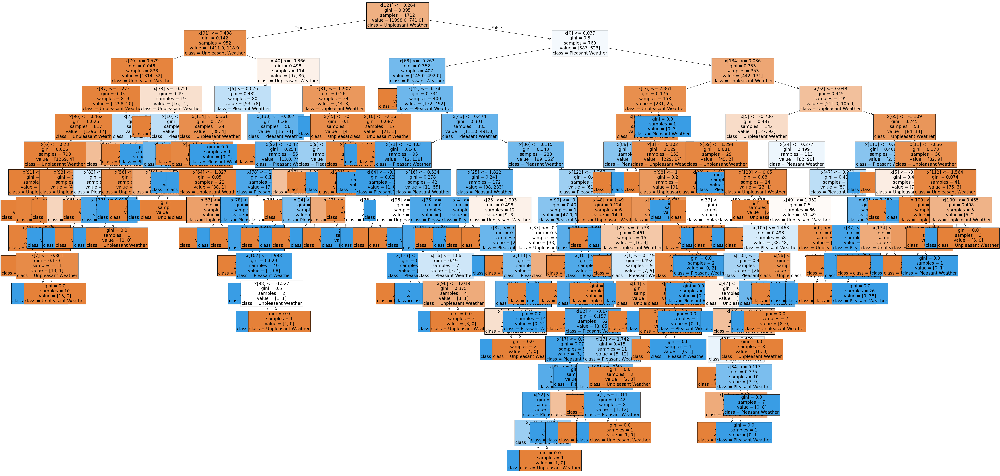

In [237]:
# Define class names for readability
class_names = ['Unpleasant Weather', 'Pleasant Weather']

# Plot the tree
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[15], 
          filled=True, 
          fontsize=20,
          feature_names=None,  # You can add your feature names here if you'd like
          class_names=class_names);  # Adds class labels at the leaves

### 06 Feature Importance Analysis

In [241]:
# Retrieve feature importances from the trained model

newarray = clf.feature_importances_
print(clf.feature_importances_.shape) # Should print: (135,)
newarray # This shows the raw importance values

(135,)


array([2.83773981e-02, 2.12281065e-02, 8.07677047e-03, 1.27984668e-02,
       1.56449865e-01, 5.87484682e-02, 3.58366082e-02, 3.25065735e-03,
       7.23828129e-02, 8.90225070e-04, 2.25604641e-03, 3.75377098e-03,
       1.62088031e-03, 8.66639240e-04, 1.31402235e-03, 3.79602163e-03,
       1.72341226e-03, 4.09174590e-03, 2.71317052e-04, 0.00000000e+00,
       0.00000000e+00, 9.46665513e-04, 9.19806607e-04, 8.08645484e-04,
       1.31450014e-02, 5.03800518e-03, 9.71956854e-03, 7.21892652e-04,
       1.65770389e-03, 7.45811163e-03, 2.63035391e-03, 1.83895372e-03,
       2.00179381e-03, 1.04162759e-02, 1.84357628e-03, 1.96149794e-02,
       1.77722632e-03, 1.86150490e-03, 1.59276642e-02, 1.80825543e-03,
       6.19161696e-03, 3.27892982e-03, 2.23126935e-02, 2.06786873e-03,
       2.54881212e-02, 1.12357134e-03, 1.99041256e-03, 6.00890510e-03,
       2.35737114e-03, 1.29443137e-03, 2.24409502e-03, 2.14663774e-02,
       2.36638971e-03, 1.57220795e-02, 1.24789235e-03, 3.66195607e-03,
      

In [243]:
# Reshape feature importances into (1, 15 stations, 9 features each)

newarray = newarray.reshape(-1, 15, 9)
print("Reshaped array shape:", newarray.shape)  # Should print: (1, 15, 9)

Reshaped array shape: (1, 15, 9)


In [247]:
# Sum across the 9 features for each station (collapse to one value per station)

sumarray = np.sum(newarray[0], axis=1)  # shape becomes (15,)

In [249]:
# Convert station set to a list and align it with importance values

unique_stations_list = list(unique_stations)

In [251]:
# Just in case station order is random in the set (to ensure consistency)

unique_stations_list.sort()

In [255]:
# Create a sorted Series and DataFrame for plotting

important = pd.Series(sumarray, index=unique_stations_list).sort_values(ascending=False)

df_importance = pd.DataFrame({
    'Weather Station': important.index,
    'Importance': important.values
})

Text(0.5, 1.0, 'Weather Station Importance — 2010s')

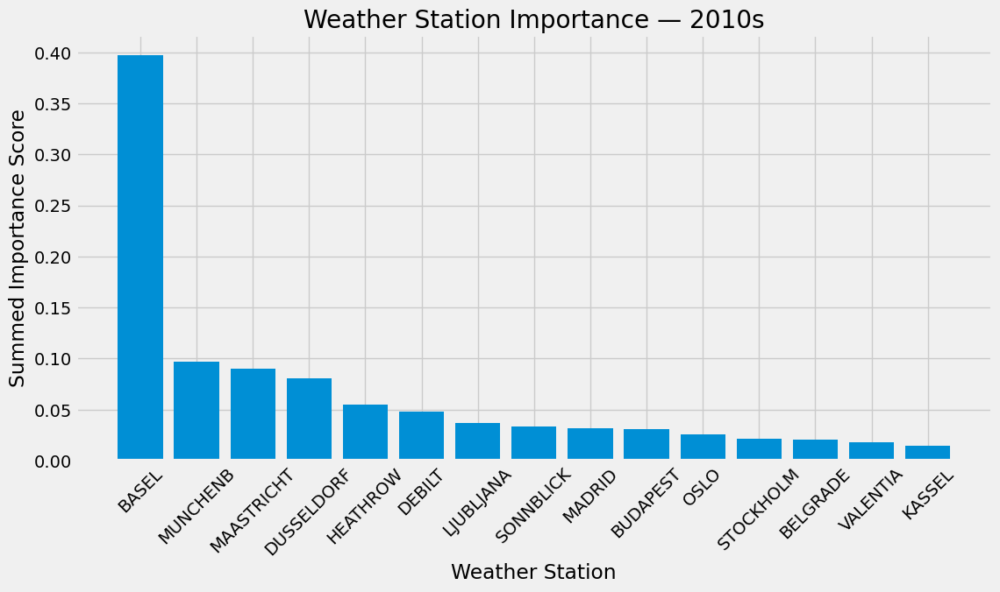

In [261]:
# Plotting

plt.style.use('fivethirtyeight')
plt.figure(figsize=(12, 6))
plt.bar(df_importance['Weather Station'], df_importance['Importance'])
plt.xticks(rotation=45)
plt.xlabel('Weather Station')
plt.ylabel('Summed Importance Score')
plt.title('Weather Station Importance — 2010s')

In [265]:
# Get all columns that start with 'BASEL'
basel_columns = [col for col in climate_decade.columns if col.startswith('BASEL')]
print(basel_columns)



['BASEL_cloud_cover', 'BASEL_humidity', 'BASEL_pressure', 'BASEL_global_radiation', 'BASEL_precipitation', 'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min', 'BASEL_temp_max']


### 07 Insights

- **High accuracy:** The Random Forest model achieved a test accuracy of **98.69%**, confirming that the selected weather indicators are highly predictive of “pleasant” days.

- **Feature coverage:** The model used **135 features** from **15 weather stations**, each providing 9 observation types (e.g., temperature, sunshine, pressure). Feature importances were extracted and reshaped for analysis.

- **Basel’s dominance:** **Basel** was by far the most influential station, contributing nearly **40%** of the total importance. This is expected since the model was trained to predict Basel’s own pleasant weather.

- **Other key stations:** **Munich** and **Maastricht** followed Basel in importance, indicating their environmental data also aligns well with pleasant day patterns.

- **Practical outcomes:** The results show that while many stations contribute, a few — especially Basel — carry most of the predictive weight. This insight can guide ClimateWins in prioritizing data sources, refining algorithms, and planning infrastructure.